In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib as mpl
import dask.dataframe as dd
from asyncio import CancelledError
from dask.delayed import delayed
from dask.distributed import Client
from cycler import cycler
from IPython.display import clear_output
import matplotlib.gridspec as gridspec
import pickle
import warnings
import geopandas as gpd
from keplergl import KeplerGl
import folium
import geopandas as gdp
from shapely.geometry import Point, Polygon 

In [2]:
default_colors = ['#00c6ff', '#0078ff', '#dd2a7b']
mpl.rcParams['axes.prop_cycle'] = cycler('color', default_colors)
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['figure.titlesize'] = 22
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['legend.title_fontsize'] = 18

# pd.set_option('display.max_colwidth', None)

## 1 Executive Summary

As years passed by, technology is becoming more and more advanced. Today, social media have become a staple in everyday lives of people and becoming one of the main methods of social connection and interaction around the world [1]. Among the social media platforms, Facebook is popular among people. In 2020, the expected number of Facebook users would reach around 1.69 billion [3]. With the huge user base of Facebook, it serves as a mode of communication and way of obtaining of information not only about the friends and family but also the local and national issues. Facebook also serve as an important channel for businesses in terms of marketing and advertising.

With the facts mentioned above, the group answered the question **"What is the distribution of the population density of Facebook users across European countries?"**. In answering this question, the group had analyzed the high population density dataset amounting to a total of over 8.12 Gb. To handle a big amount of data surpassing the capability of the local machine/client's memory, the group had used distributed dask clustering. Here are the steps we took to answer this question:

1. Extracted data from https://registry.opendata.aws/dataforgood-fb-hrsl/. The group had chosen 24 European countries.
2. Processed data such as feature engineering and merging of columns
3. Performed exploratory data analysis

## 2 Introduction

Social media focused on building social networks and relations among people with shared interests [1]. Among the social media platforms, Facebook is one of the most popular. In the first quarter of 2015, there are around 1.44 billion active users of Facebook [2].  Statistics had also showed that in 2020, the expected number of Facebook users would reach 1.69 billion [3]. Nowadays, people tend to reach some of the most significant news through Facebook and it also served as as tool for organization of events [2]. Facebook lead to a wider scope of applications with increasing global impact on society and government [1]. The team wants to analyze the distribution of the population density of Facebook users across European countries and create recommendations.

## 3 Data

### 3.1 Data Description

The dataset was retrieved from https://registry.opendata.aws/dataforgood-fb-hrsl/. The team had used the High-Resolution Population Density Maps + Demographic Estimates by CIESIN and Facebook with a total size of 67.5 Gb and the csv files size of 27Gb. The dataset contains csv files for the `Overall population density`, `Male`, `Female`, `Women of reproductive age (ages 15-49)`, `Children (ages 0-5)`, `Youth (ages 15-24)`, `Elderly (ages 60+)`. The team only used selected European countries.

<center><b>Table 1. European Countries with its Country Code</b></center>

| Code | Country | Code | Country |
| ------------- |:-------------:| ------------- |:-------------:| 
|GBR| United Kingdom|HRV|Croatia|
|FRA| France| CZE|Czechia|
|ITA| Italy|ROU|Romania|
| ESP | Spain|UKR|Ukraine|
|PRT|Portugal|HUN|Hungary|
|CHE|Switzerland|ALB|Albania|
|GRC|Greece|SVK|Slovakia|
|DEU|Germany|MNE|Montenegro|
|NLD|Netherlands|MDA|Moldova|
|POL|Poland|SRB|Serbia|
|BEL|Belgium|BLR|Belarus|
|AUT|Austria|ISL|Iceland|

The Comma Separated Value (CSV) files are in the format of latitude, longitude and population size.


<center><b>Table 2. Data Description</b></center>

| Variable Name | Variable | Description | Data Type |
| ------------- |:-------------:| ------------- |:-------------:| 
|latitude|latitude|angular distance north or south from the equator of a point on the earth’s surface [4]| int|
|longitude|longitude|geographical angular distance east or west on the earth’s surface [4]|int|
|population|population size|number of people living within 30-meter grid tiles|int|

### 3.2 Data Extraction

In [3]:
client = Client('13.58.189.185:8786')

/opt/conda/lib/python3.8/site-packages/distributed/client.py:1129: VersionMismatchWarning: Mismatched versions found

+---------+---------------+---------------+---------------+
| Package | client        | scheduler     | workers       |
+---------+---------------+---------------+---------------+
| python  | 3.8.2.final.0 | 3.8.2.final.0 | 3.8.5.final.0 |
+---------+---------------+---------------+---------------+
  warnings.warn(version_module.VersionMismatchWarning(msg[0]["warning"]))


In [4]:
client

Client Scheduler: tcp://13.58.189.185:8786 Dashboard: http://13.58.189.185:8787/status,Cluster Workers: 3 Cores: 6 Memory: 25.04 GB


In [5]:
def get_path(country):
    """Return country CSV path"""
    return dict(total_pop=('s3://dataforgood-fb-data/csv/month=2019-06'
                           f'/country={country}/type=total_population'
                           f'/{country}_total_population.csv.gz'),
                child=('s3://dataforgood-fb-data/csv/month=2019-06'
                       f'/country={country}/type=children_under_five'
                       f'/{country}_children_under_five.csv.gz'),
                elder=('s3://dataforgood-fb-data/csv/month=2019-06'
                       f'/country={country}/type=elderly_60_plus'
                       f'/{country}_elderly_60_plus.csv.gz'),
                men=('s3://dataforgood-fb-data/csv/month=2019-06'
                     f'/country={country}/type=men'
                     f'/{country}_men.csv.gz'),
                women=('s3://dataforgood-fb-data/csv/month=2019-06'
                       f'/country={country}/type=women'
                       f'/{country}_women.csv.gz'),
                reprod=('s3://dataforgood-fb-data/csv/month=2019-06'
                        f'/country={country}'
                        '/type=women_of_reproductive_age_15_49'
                        f'/{country}_women_of_'
                        'reproductive_age_15_49.csv.gz'),
                youth=('s3://dataforgood-fb-data/csv/month=2019-06'
                       f'/country={country}/type=youth_15_24'
                       f'/{country}_youth_15_24.csv.gz')
                )

In [6]:
countries = ['GBR',
             'FRA',
             'ITA',
             'ESP',
             'PRT',
             'CHE',
             'GRC',
             'DEU',
             'NLD',
             'POL',
             'BEL',
             'AUT',
             'ISL',
             'HRV',
             'CZE',
             'ROU',
             'UKR',
             'HUN',
             'ALB',
             'SVK',
             'MNE',
             'MDA',
             'SRB',
             'BLR']

In [7]:
df_countries_total_pop = dict()
df_countries_men = dict()
df_countries_women = dict()

#### 3.2.1 Total Population

In [9]:
for country in countries:
    print('Extracting data from {}'.format(country))
    dfs_total_pop = [delayed(pd.read_csv)(get_path(country)['total_pop'],
                                          encoding='utf-8', sep='\t',
                                          compression='gzip')]
    print('Converting to DataFrame {}'.format(country))

    try:
        df_total_pop = dd.from_delayed(dfs_total_pop)
    except CancelledError:
        df_total_pop = dd.from_delayed(dfs_total_pop)

    print('Repartition {}'.format(country))
    df_total_pop = df_total_pop.repartition(npartitions=100)
    df_countries_total_pop[country] = df_total_pop

    del dfs_total_pop
    del df_total_pop

clear_output()
print('Done')

In [10]:
with open('res (total_pop).pkl', 'wb') as f:
    pickle.dump(df_countries_total_pop, f)

#### 3.2.2 Women

In [12]:
for country in countries:
    print('Extracting data from {}'.format(country))
    dfs_women = [delayed(pd.read_csv)(get_path(country)['women'],
                                      encoding='utf-8', sep='\t',
                                      compression='gzip')]
    print('Converting to DataFrame {}'.format(country))

    try:
        df_women = dd.from_delayed(dfs_women)
    except CancelledError:
        df_women = dd.from_delayed(dfs_women)

    print('Repartition {}'.format(country))
    df_women = df_women.repartition(npartitions=100)
    df_countries_women[country] = df_women

    del dfs_women
    del df_women

clear_output()
print('Done')

Done


In [12]:
with open('res (women).pkl', 'wb') as f:
    pickle.dump(df_countries_women, f)

#### 3.2.3 Men

In [13]:
for country in countries:
    print('Extracting data from {}'.format(country))
    dfs_men = [delayed(pd.read_csv)(get_path(country)['men'],
                                    encoding='utf-8', sep='\t',
                                    compression='gzip')]
    print('Converting to DataFrame {}'.format(country))

    try:
        df_men = dd.from_delayed(dfs_men)
    except CancelledError:
        df_men = dd.from_delayed(dfs_men)

    print('Repartition {}'.format(country))
    df_men = df_men.repartition(npartitions=100)
    df_countries_men[country] = df_men

    del dfs_men
    del df_men

clear_output()
print('Done')

Done


In [14]:
with open('res (men).pkl', 'wb') as f:
    pickle.dump(df_countries_men, f)

In [10]:
#Load results

# Initialize variable container
variables = {}

for name in ['total_pop', 'women', 'men']:
    with open('res ({}).pkl'.format(name), 'rb') as f:
        variables[name] = pickle.load(f)

df_countries_total_pop = variables['total_pop']
df_countries_women = variables['women']
df_countries_men = variables['men']

## 4 Data Preprocessing


Merge all the datasets per category to compare different countries. We added a new column country and people count to determine the total number of people per 30 sqm and identify which country the row belonged.

In [11]:
def add_features(df, country):
    """Return dataframe with required column columns"""
    df = df.copy()
    df['country'] = country
    # Population density with 30 sqm
    df['people_count'] = df['population'].apply(lambda x: int(x*30),
                                                meta=('population', 'int64'))
    return df

### 4.1 Total Population

In [12]:
df_total_pop = dd.concat([add_features(ddf, country)
                          for country, ddf in df_countries_total_pop.items()],
                         axis=0)

In [13]:
df_total_pop.count().compute()

latitude        229182034
longitude       229182034
population      229182034
country         229182034
people_count    229182034
dtype: int64

### 4.2 Women

In [14]:
df_women = dd.concat([add_features(ddf, country)
                      for country, ddf in df_countries_women.items()],
                     axis=0)

In [15]:
df_women.count().compute()

latitude        229182034
longitude       229182034
population      229182034
country         229182034
people_count    229182034
dtype: int64

### 4.3 Men

In [16]:
df_men = dd.concat([add_features(ddf, country)
                    for country, ddf in df_countries_men.items()],
                   axis=0)

In [17]:
df_men.count().compute()

latitude        229182034
longitude       229182034
population      229182034
country         229182034
people_count    229182034
dtype: int64

# 5 Exploratory Data Analysis

### 5.1 Distribution of Men and Women across European Countries

In [19]:
total_pop_all = df_total_pop.groupby(['country']).people_count.sum().compute()
total_pop_all.sort_values(inplace=True)
total_pop_women = df_women.groupby(['country']).people_count.sum().compute()
total_pop_women.sort_values(inplace=True)
total_pop_men = df_men.groupby(['country']).people_count.sum().compute()
total_pop_men.sort_values(inplace=True)

In [20]:
# Save results

for variable, name in zip([total_pop_all, total_pop_women, total_pop_men], 
                          ['total_pop_all', 'total_pop_women', 'total_pop_men']):
    with open('{}.pkl'.format(name), 'wb') as f:
        pickle.dump(variable, f)

In [16]:
#Load results

# Initialize variable container
variables = {}

for name in ['total_pop_all', 'total_pop_women', 'total_pop_men']:
    with open('{}.pkl'.format(name), 'rb') as f:
        variables[name] = pickle.load(f)

total_pop_all = variables['total_pop_all']
total_pop_women = variables['total_pop_women']
total_pop_men = variables['total_pop_men']

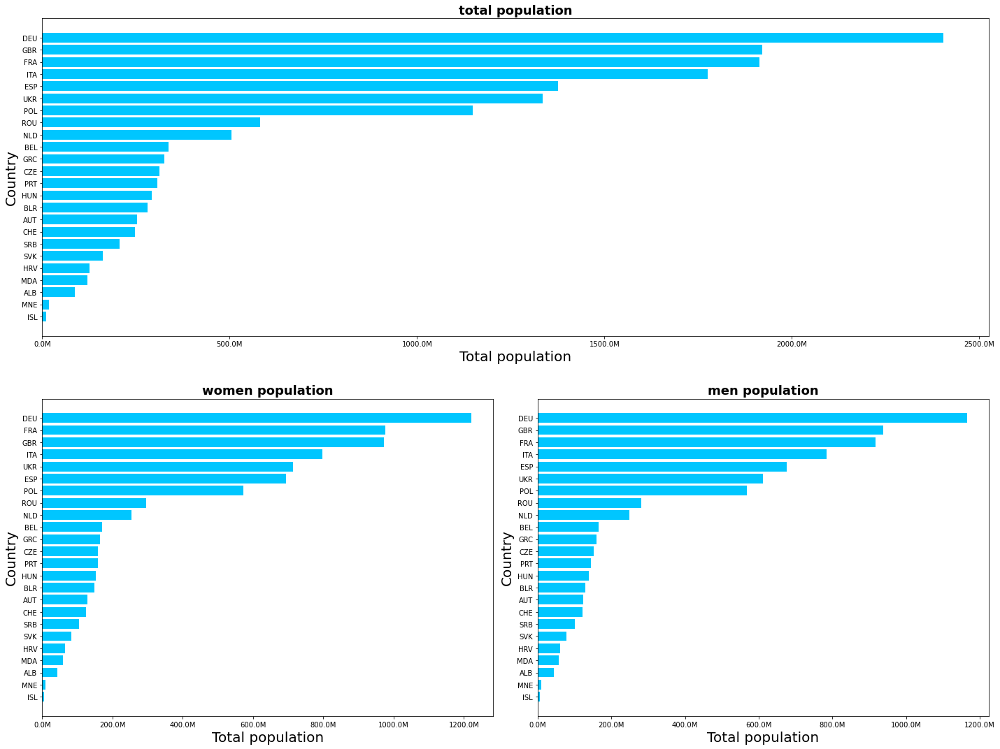

In [18]:
fig1 = plt.figure(constrained_layout=False, figsize=(20, 15))
spec1 = gridspec.GridSpec(ncols=2, nrows=2, figure=fig1)

ax0 = fig1.add_subplot(spec1[0, :])
ax1 = fig1.add_subplot(spec1[1:, 0])
ax2 = fig1.add_subplot(spec1[1:, 1:])

y_total_pop_all = total_pop_all.index
x_total_pop_all = total_pop_all.values

y_women = total_pop_women.index
x_women = total_pop_women.values

y_men = total_pop_men.index
x_men = total_pop_men.values

# Plot data
ax0.barh(y_total_pop_all, x_total_pop_all)
ax0.set_title('total population')
ax0.set_ylabel('Country')
ax0.set_xlabel('Total population')

ax1.barh(y_women, x_women)
ax1.set_title('women population')
ax1.set_ylabel('Country')
ax1.set_xlabel('Total population')

ax2.barh(y_men, x_men)
ax2.set_title('men population')
ax2.set_ylabel('Country')
ax2.set_xlabel('Total population')

# Change ticks
xlabels = [f'{x:.1f}M' for x in ax0.get_xticks()/1e6]
ax0.set_xticklabels(xlabels)

xlabels = [f'{x:.1f}M' for x in ax1.get_xticks()/1e6]
ax1.set_xticklabels(xlabels)

xlabels = [f'{x:.1f}M' for x in ax2.get_xticks()/1e6]
ax2.set_xticklabels(xlabels)

plt.tight_layout(h_pad=3)
plt.show()
warnings.filterwarnings('ignore')

## Geospatial Analysis

In [23]:
x = df_countries_women['ISL'].groupby(['latitude', 'longitude']).sum().reset_index().compute()
# x = x[x.population > x.population.quantile(.40)]

In [24]:
x

,latitude,longitude,population
0,64.645139,-17.034028,0.013585
1,64.645694,-17.032639,0.013585
2,64.647083,-17.033750,0.013585
3,64.647361,-17.049028,0.013585
4,64.648194,-17.042361,0.013585
...,...,...,...
120399,65.047917,-22.744028,0.109599
120400,65.050417,-22.742083,0.109599
120401,65.050694,-22.742083,0.109599
120402,65.050694,-22.741806,0.109599


In [32]:
from folium.plugins import HeatMap

base_map = folium.Map(location= [x.latitude.mean(), 
                                x.longitude.mean()], 
                                default_zoom_start=11)

In [37]:
hm = HeatMap(x.values,radius=8, max_zoom = 13).add_to(base_map)
base_map

In [27]:
y = df_countries_women['DEU'].groupby(['latitude', 'longitude']).sum().reset_index().compute()
y = y[y.population > y.population.quantile(.75)]

In [28]:
y

,latitude,longitude,population
2619,47.714583,8.894028,1.661057
2656,47.715139,8.896806,1.661057
2669,47.715417,8.896806,1.661057
2717,47.716250,8.892083,1.661057
2730,47.716528,8.888194,1.661057
...,...,...,...
32444215,54.703194,8.567083,5.848506
32444280,54.709028,8.567361,5.848506
32444332,54.714306,8.577361,5.848506
32444334,54.714583,8.576528,5.848506


In [29]:
base_map_deu = folium.Map(location= [y.latitude.mean(), 
                                y.longitude.mean()], 
                                default_zoom_start=11)

In [ ]:
from folium.plugins import HeatMap

hm_deu = HeatMap(y.values,radius=8, max_zoom = 13).add_to(base_map_deu)
base_map_deu

In [25]:
df_countries_women['ISL'].population.quantile(0.4).compute()

0.5392988000000001

# References

[1] Salem, Fadi & Mourtada, Rachi. (2011). _Facebook Usage: Factors and Analysis_. Arab Social Media Report.

[2]  Boukouvidis, T. (2015). _Four Reasons Facebook Is So Popular_. Retrieved 29 November 2020, from https://www.theodysseyonline.com/four-reasons-facebook-so-popular.

[3] Clement, J. (2019). _Facebook: number of users worldwide_. Retrieved 29 November 2020, from https://www.statista.com/statistics/490424/number-of-worldwide-facebook-users/#:~:text=This%20statistic%20shows%20the%20number,from%201.34%20million%20in%202014.

[4] _"Latitude" vs. "Longitude"_. Dictionary.com. (2020). Retrieved 29 November 2020, from https://www.dictionary.com/e/latitude-vs-longitude/.

# Appendices

### Appendix A. Running of Instances

<img src = "instances.PNG">

### Appendix B. Client

<img src = "client.PNG">